# Systems and Signals 414 Practical 5: Comb Filter

**Aim:** Design of a simple comb filter, and investigation of the frequency behaviour of systems and signals.

**Hand in:** Please hand in this notebook as a PDF file on sunlearn by Sunday, 13 May at 23:55. To save your notebook to a PDF, you can  print the notebook from your browser and then choose to `Save as PDF`. (If you are doing the practical on a machine with LaTeX, you can also select `File`$\rightarrow$ `Download as` $\rightarrow$ `PDF via LaTeX (.pdf)` directly in the notebook). After exporting your notebook, upload the PDF by clicking on `Practical 5 submission` on sunlearn and following the steps. You may submit your work multiple times; only the last submission will be marked. **No late submissions will be accepted.**

**Task:** Do the following assignment using Jupyter. Document the task indicating your methodology, theoretical results, numerical results and discussions as necessary. Your graphs should have labeled axes with the correct units indicated. If you get stuck with a Numpy or Scipy function, go look up the usage at https://docs.scipy.org. Also take a look at the provided coding examples.

**Preamble code and helper functions:**

In [1]:
#%matplotlib notebook
%matplotlib inline

#All the necessary imports
import pylab as pl
import numpy as np
from scipy import signal
import IPython.display

#Nicer matplotlib dimensions
pl.rcParams['figure.figsize'] = (9,3)

#A helper-function to setup a proper plot
def setup_plot(title, y_label='', x_label='', newfig=True):
    if newfig:
        pl.figure()
    pl.margins(*(pl.array(pl.margins())+0.05))
    pl.title(title)
    pl.ylabel(y_label)
    pl.xlabel(x_label)

#Download yesterday.wav from courses.ee.sun.ac.za and return it as a numpy array
def download_and_load_audio(url, mono=True, factor_of_2_length=True):
    import os
    import urllib
    import scipy.io
    from scipy.io import wavfile
    
    filename = os.path.split(url)[-1]
    #Download if path does not already exist
    if not os.path.isfile(filename):
        urllib.request.urlretrieve(url, filename)
    sample_frequency, signal_array = wavfile.read(filename)
    #Normalise signal and return
    if mono and len(signal_array.shape)==2:
        signal_array = np.sum(signal_array, axis=1)
    signal_array = signal_array/np.max([np.max(signal_array),
                                        -np.min(signal_array)])
    if factor_of_2_length:
        signal_array = signal_array[:2**np.floor(np.log2(len(signal_array)))
                                    .astype('int')]
    
    return sample_frequency, signal_array

#Adapted from https://gist.github.com/endolith/4625838
def zplane(zeros, poles):
    """
    Plot the complex z-plane given zeros and poles.
    """
    zeros=np.array(zeros);
    poles=np.array(poles);
    ax = pl.gca()

    # Add unit circle and zero axes    
    unit_circle = pl.matplotlib.patches.Circle((0,0), radius=1, fill=False,
                                 color='black', ls='solid', alpha=0.6)
    ax.add_patch(unit_circle)
    pl.axvline(0, color='0.7')
    pl.axhline(0, color='0.7')

    #Rescale to a nice size
    rscale = 1.2 * np.amax(np.concatenate((abs(zeros), abs(poles), [1])))
    pl.axis('scaled')
    pl.axis([-rscale, rscale, -rscale, rscale])
    
    # Plot the poles and zeros
    polesplot = pl.plot(poles.real, poles.imag, 'x', markersize=9)
    zerosplot = pl.plot(zeros.real, zeros.imag,  'o', markersize=9, color='none', 
                             markeredgecolor=polesplot[0].get_color(), 
                             )

    #Draw overlap text
    overlap_txt = []
    def draw_overlap_text():
        for txt in overlap_txt:
            try:    txt.remove()
            except: txt.set_visible(False)
        del overlap_txt[:]

        poles_pixel_positions = ax.transData.transform(np.vstack(polesplot[0].get_data()).T)
        zeros_pixel_positions = ax.transData.transform(np.vstack(zerosplot[0].get_data()).T)

        for (zps_pixels, zps) in [(poles_pixel_positions, poles), (zeros_pixel_positions, zeros)]:
            superscript = np.ones(len(zps))
            for i in range(len(zps)):
                for j in range(i+1,len(zps)):
                    if superscript[i]!=-1:
                        if np.all(np.abs(zps_pixels[i] - zps_pixels[j]) < 0.9):
                            superscript[i]+=1;
                            superscript[j]=-1;
            for i in range(len(zps)):
                if superscript[i] > 1:
                    txt = pl.text(zps[i].real, zps[i].imag,
                            r'${}^{%d}$'%superscript[i], fontsize=20
                            )
                    overlap_txt.append(txt)
    draw_overlap_text()

    #Reset when zooming
    def on_zoom_change(axes): draw_overlap_text()
    ax.callbacks.connect('xlim_changed', on_zoom_change)
    ax.callbacks.connect('ylim_changed', on_zoom_change)

**Functions necessary for this practical**

Scipy provides a good selection of signal processing tools in scipy.signal. Note the following functions important for this practical:

`signal.freqz(b, a, whole=True, ...)`<br>
We use this function for plotting purposes only. It returns $\omega$ coordinates to illustrate the frequency response of a given filter. Use the keyword arguments `whole=True` to return for $\omega=0$ up to $\omega=2 \pi$. The filter is of type:
$$H(z) = \frac{b_0 + b_1 z^{-1} + b_2 z^{-2} +\ldots}{a_0 + a_1 z^{-1} + a_2 z^{-2}+\ldots}$$

`signal.lfilter(b, a, x, ...)`<br>
Given a signal $x[n]$, this function will apply the difference equation given by $\mathbf{b}$ and $\mathbf{a}$ on the input signal and returns the result (this is what you had to painstakingly code up in Practical 1 and 2). Note the difference equation is of type:
$$a_0 y[n] = -a_1y[n-1] -a_2y[n-2] \ldots +b_0x[n] + b_1x[n-1] + b_2x[n-2] \ldots$$

`signal.tf2zpk(b, a)`<br>
This returns poles and zeros parameters $\mathbf{z}$, $\mathbf{p}$, and $k$ as output from filter parameters $\mathbf{b}$ and $\mathbf{a}$ as input, with accordance to:
$$H(z) = \frac{b_0^{M} + b_1 z^{M-1} + b_2 z^{M-2} + \ldots}{a_0^{N} + a_1 z^{N-1} + a_2 z^{N-2} + \ldots} = k\frac{(z-z_0)(z-z_1)\ldots}{(z-p_0)(z-p_1)\ldots} $$

`signal.zpk2tf(z, p, k)`<br>
The reverse conversion as provided by `signal.tf2zpk`.

`np.unwrap(p, ...)`<br>
Use this function to remedy unwanted angular wrapping between $-\pi$ and $\pi$ for linearly-increasing angles. You may have noticed this wrapping as the sawtooth-type effect on your phase plots.

### Question 1: All zeros comb filter
Consider the setup below with $x_1[n]$ represents a desired signal and $x_2[n]$ an interfering signal:

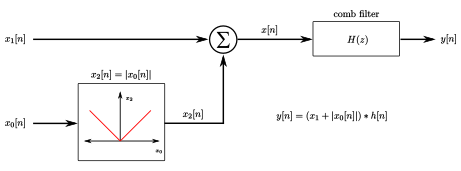

In [2]:
IPython.display.display(IPython.display.SVG('texdoc.svg'))

Signal $x_1[n]$ is an audio-snippet, downloadable from sunlearn, named `over_the_garden_wall.wav`. It is included in the zip file for this practical. The audio is sampled at $f_s = 10000$ Hz.

The audio is taken from the intro of *Over The Garden Wall* (http://www.imdb.com/title/tt3718778/). Signal $x_0[n]$ is a sinusoid with frequency $f_0 = 500$ Hz, amplitude $A=\frac{1}{2}$, sample frequency $f_s = 10000$, and with the same length as $x_1[n]$. Complete the following questions:
1. Generate/load the signals $x_0[n]$, $x_1[n]$, $x_2[n]$ and $x[n]$. <br>(a) As a single subplot, plot the signal $x_1[n]$ over time $25$s $\leq t < 25.02$s using `pl.plot`, and plot the full sampled magnitude spectra $|X_1[k]|$ with $f_\omega$ as the x-axis (also using `pl.plot`). Make sure your plots are labeled correctly. <br>(b) Repeat (a) for the signal $x_2[n]$. <br>(c) Repeat (a) for the signal $x[n]$.
2. Use `IPython.display.Audio` and listen to the audio signals $x_1[n]$ and $x[n]$.
3. Now design an all zeros comb filter $H(z)$ to rid $x[n]$ of the interfering signal $x_2[n]$. Provide the transfer functions and difference equations of both the prototype filter and the resulting comb filter. Plot the pole-zero patterns of the resulting comb filter by using the given `zplane` function. Note that if you encounter any DC noise, the DC noise should be filtered out as well.
3. Plot the frequency responses of both the prototype filter and the resulting comb filter with $f_\omega$ on the x-axis by making use of `signal.freqz`. By default `signal.freqz` uses a frequency range of $0\leq f_\omega < \frac{1}{2}$, cover the whole unit circle ($0 \leq f_\omega < 1$) by setting the keyword argument `whole=True`.
5. Filter $x[n]$ with the designed comb filter to obtain $y[n]$. Plot this signal in the same manner as in Question 1.1a, and use `IPython.display.Audio` to listen to $y[n]$.

### Question 2: Comb filter with resonant poles
1. Repeat Question 1.3-1.5, but now design a comb filter with zeros and resonant poles.
2. What effect does the resonant poles have with regards to signal $y[n]$? Can you hear an audible difference between the signals $x_1[n]$ and $y[n]$ using the filter design of Question 1? How about when using the filter design of Question 2?

### Coding examples
**Example of poles-zero plot**

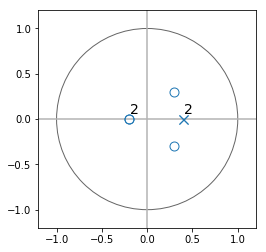

In [3]:
setup_plot('');
zplane([0.3+0.3j, 0.3-0.3j, -0.2, -0.2], [0.4, 0.4]);

**Example of sub-plotting**

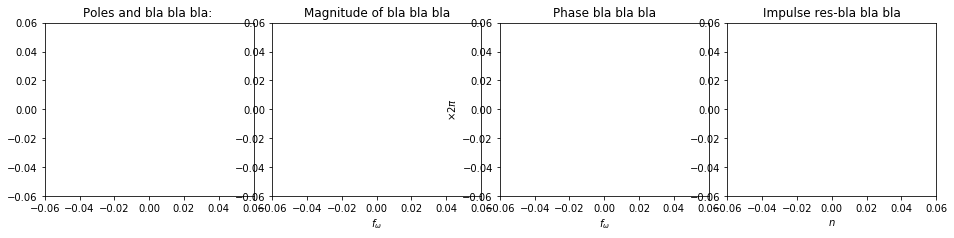

In [4]:
pl.figure(figsize=(13,3))

pl.subplot(1, 4, 1)
pl.tight_layout()
setup_plot('Poles and bla bla bla: ', newfig=False)
#plot here

pl.subplot(1, 4, 2)
setup_plot('Magnitude of bla bla bla', x_label=r'$f_\omega$', newfig=False)
#plot here

pl.subplot(1, 4, 3)
setup_plot(r'Phase bla bla bla', y_label=r'$\times 2 \pi$', x_label=r'$f_\omega$', newfig=False)
#plot here

pl.subplot(1, 4, 4)
setup_plot('Impulse res-bla bla bla', x_label='$n$', newfig=False)
#plot here

**Note the difference between linspace and arange:**

In [5]:
#Every second element from 0 upto (but excluding) 10
print('a)', np.arange(0,10,1))

#5 elements from 0 upto (but excluding) 10
print('b)', np.linspace(0,10,10,False))

#5 elements from 0 upto 10 (avoid!!!)
print('c)', np.linspace(0,10,10))

a) [0 1 2 3 4 5 6 7 8 9]
b) [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
c) [ 0.          1.11111111  2.22222222  3.33333333  4.44444444  5.55555556
  6.66666667  7.77777778  8.88888889 10.        ]


**Audio player with Ipython.lib.display.Audio**

In [6]:
example_signal = np.sin(2*np.pi*500*np.linspace(0,5,50000))
IPython.lib.display.Audio(rate=10000,
                          data=example_signal)

# Answer space:

In [9]:
#Setup
fs1, x1 = download_and_load_audio("over_the_garden_wall.wav")
n = x1.size
final = n / fs

time = np.linspace(0, final, n, False)
fs0 = 500

x0 = np.sin(fs0 * time * np.pi * 2) / 2
x2 = np.abs(x0)
x = x1 + x2


<Figure size 432x288 with 0 Axes>

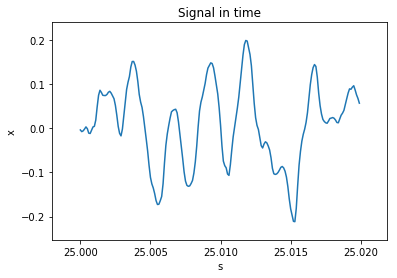

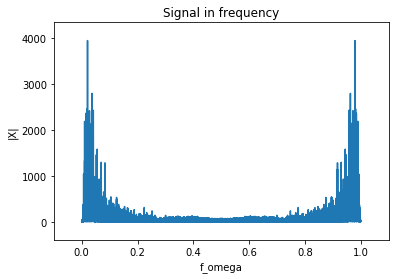

In [10]:
#Question 1
#1a
X1 = np.abs(np.fft.fft(x1))
fomega = np.linspace(0, 1, n)

pl.figure()
setup_plot('Signal in time', "x", "s")
pl.plot(time[(25 * fs1):round(25.02 * fs1)], x1[(25 * fs1):round(25.02 * fs1)])
setup_plot('Signal in frequency', "|X|", "f_omega")
pl.plot(fomega, X1)


<Figure size 432x288 with 0 Axes>

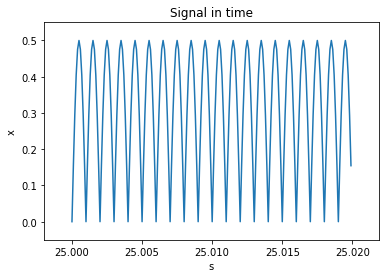

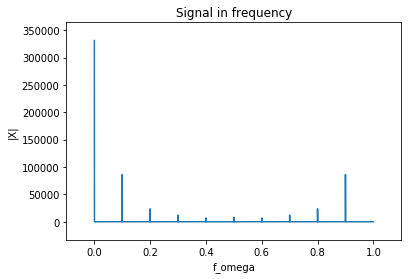

In [12]:
#1b
X2 = np.abs(np.fft.fft(x2))

pl.figure()
setup_plot('Signal in time', "x", "s")
pl.plot(time[(25 * fs1):round(25.02 * fs1)], x2[(25 * fs1):round(25.02 * fs1)])
setup_plot('Signal in frequency', "|X|", "f_omega")
pl.plot(fomega, X2)


<Figure size 432x288 with 0 Axes>

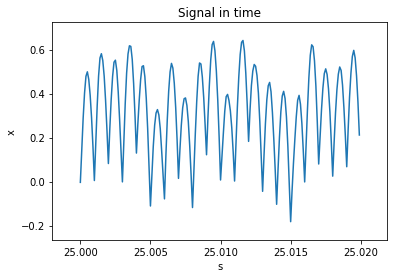

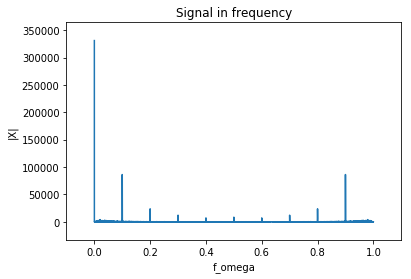

In [13]:
#1c
X = np.abs(np.fft.fft(x))

pl.figure()
setup_plot('Signal in time', "x", "s")
pl.plot(time[(25 * fs1):round(25.02 * fs1)], x[(25 * fs1):round(25.02 * fs1)])
setup_plot('Signal in frequency', "|X|", "f_omega")
pl.plot(fomega, X)


In [16]:
#2
IPython.display.Audio(rate=fs1, data=x1)



In [17]:
IPython.display.Audio(rate=fs1, data=x)


In [22]:
#Extra setup
def plotZchart(a, b):
    z, p, k = signal.tf2zpk(b, a)
    
    omega, H = signal.freqz(b, a, whole=True)
    omega = np.linspace(0, 1, omega.size)
    
    setup_plot("Poles and Zeroes")
    zplane(z, p)
    setup_plot("Magnitude Resp", "|X|", "f_omega")
    pl.plot(omega, np.abs(H))

#Defining an impulse
delta = np.zeros(x.size)
delta[0] = 1    

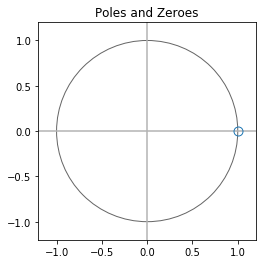

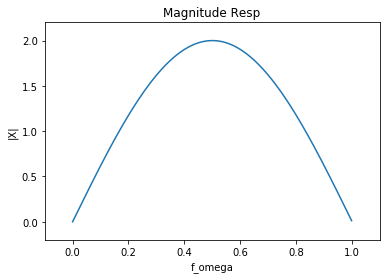

In [23]:
#3-5
''' 
    The first frequency to filter out will be 0. Hence we should aim to have w=0.
    Hence if we use H=1-z^-1 with y[n]=x[n]-x[n-1]
'''
a = 1
b = [1, -1]
plotZchart(a, b)

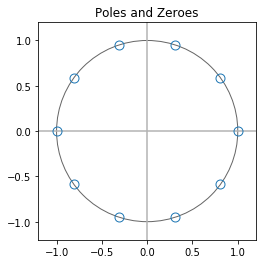

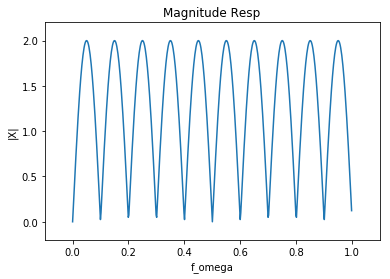

In [26]:
'''
    We want to squash the frequency response with 10 points with a size of 0. 
    Our comb filter is then: H(z)=1-z^-10 with difference eqn of y[n]=x[n]-x[n-10]
'''
a = 1
b = [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1]
plotZchart(a, b)

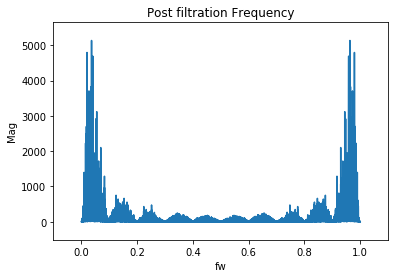

In [27]:
resp = signal.lfilter(a=a, b=b, x=x)
setup_plot("Post filtration Frequency", "Mag", "fw")
pl.plot(np.linspace(0, 1, x.size), np.abs(np.fft.fft(resp)))

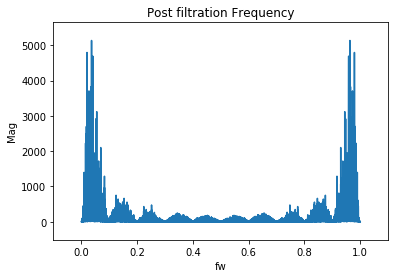

In [28]:
'''
    The noise is now filtered out but the signal itself is also reduced severely.
'''
y = x - np.append(np.zeros(10), x[:-10])
setup_plot("Post filtration Frequency", "Mag", "fw")
pl.plot(np.linspace(0, 1, y.size), np.abs(np.fft.fft(y)))

In [29]:
'''
    This result is the exact same as before.
'''
IPython.display.Audio(rate=fs1, data=np.real(resp))

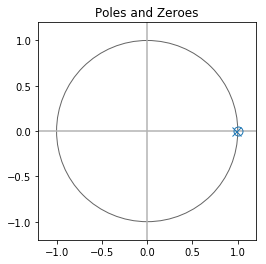

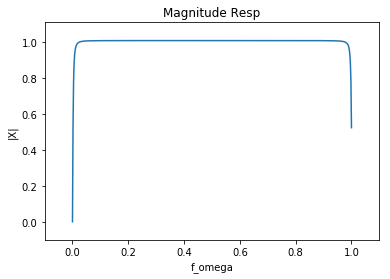

In [30]:
#Question 2
'''
    This time a resonant pole is wanted. 
    H(z) = 1 - z^-1  /  1 - 0.98z^-1
    y[n] = x[n] - x[n-1] + 0.98y[n-1]
'''

a = [1, -0.98]
b = [1, -1]
plotZchart(a, b)

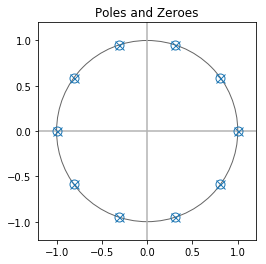

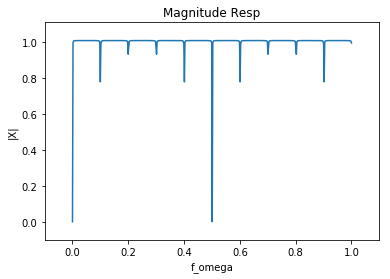

In [31]:
'''
    Once again we want 10 equally spaced points with zero magn.
    H(z) = 1 - z^-10  /  1 - 0.98z^-10
    y[n] = x[n] - x[n-10] + 0.98y[n-10]
'''
a = [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, -0.98]
b = [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1]
plotZchart(a, b)

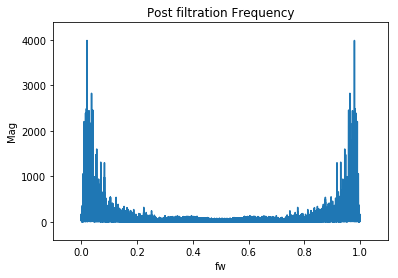

In [32]:
resp = signal.lfilter(a=a, b=b, x=x)
setup_plot("Post filtration Frequency", "Mag", "fw")
pl.plot(np.linspace(0, 1, x.size), np.abs(np.fft.fft(resp)))

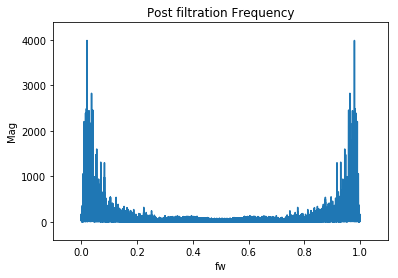

In [34]:
y = np.array(x)
for i in np.arange(10, x.size):
    y[i] += 0.98*y[i-10] - x[i-10]
    
setup_plot("Post filtration Frequency", "Mag", "fw")
pl.plot(np.linspace(0, 1, y.size), np.abs(np.fft.fft(y)))

In [35]:
'''
    The same result is once again obtained
'''
IPython.display.Audio(rate=fs1, data=np.real(resp))

In [ ]:
'''
    Both filters completely remove the noise.
    The second filter is a minor improvement over the first.
'''